In [66]:
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns

## Data Import

In [67]:
x_train = pd.read_csv('data/x_train.csv', index_col='ID' ).drop('DAY_ID', axis= 1)
x_test = pd.read_csv('data/x_test.csv', index_col='ID').drop('DAY_ID', axis= 1)

y_train = pd.read_csv('data/y_train.csv', index_col='ID')

x_train['TARGET'] = y_train['TARGET']

x_train.head()

,COUNTRY,DE_CONSUMPTION,FR_CONSUMPTION,DE_FR_EXCHANGE,FR_DE_EXCHANGE,DE_NET_EXPORT,FR_NET_EXPORT,DE_NET_IMPORT,FR_NET_IMPORT,DE_GAS,...,DE_RAIN,FR_RAIN,DE_WIND,FR_WIND,DE_TEMP,FR_TEMP,GAS_RET,COAL_RET,CARBON_RET,TARGET
ID,,,,,,,,,,,,,,,,,,,,,
1054,FR,0.210099,-0.427458,-0.606523,0.606523,NaN,0.692860,NaN,-0.692860,0.441238,...,-0.172680,-0.556356,-0.790823,-0.283160,-1.069070,-0.063404,0.339041,0.124552,-0.002445,0.028313
2049,FR,-0.022399,-1.003452,-0.022063,0.022063,-0.573520,-1.130838,0.573520,1.130838,0.174773,...,-1.240300,-0.770457,1.522331,0.828412,0.437419,1.831241,-0.659091,0.047114,-0.490365,-0.112516
1924,FR,1.395035,1.978665,1.021305,-1.021305,-0.622021,-1.682587,0.622021,1.682587,2.351913,...,-0.480700,-0.313338,0.431134,0.487608,0.684884,0.114836,0.535974,0.743338,0.204952,-0.180840
297,DE,-0.983324,-0.849198,-0.839586,0.839586,-0.270870,0.563230,0.270870,-0.563230,0.487818,...,-1.114838,-0.507570,-0.499409,-0.236249,0.350938,-0.417514,0.911652,-0.296168,1.073948,-0.260356
1101,FR,0.143807,-0.617038,-0.924990,0.924990,NaN,0.990324,NaN,-0.990324,0.238693,...,-0.541465,-0.424550,-1.088158,-1.011560,0.614338,0.729495,0.245109,1.526606,2.614378,-0.071733


In [68]:
def get_country_data(country):
    values = x_train[x_train['COUNTRY'] == country.upper()]
    res = pd.DataFrame()
    for c in values.columns:
        if c[:3] == f'{country.upper()}_' and c[3:] != 'LIGNITE':
            res[c[3:]] = values[c]

    for data_c in ['GAS_RET', 'COAL_RET', 'CARBON_RET', 'TARGET']:
        res[data_c] = values[data_c]

    return res

de_train = get_country_data('de')
de_test = get_country_data('de')

fr_train = get_country_data('fr')
fr_test = get_country_data('fr')

## Exploratory Data Analysis

### France EDA

In [69]:
fr_train.describe()


,CONSUMPTION,DE_EXCHANGE,NET_EXPORT,NET_IMPORT,GAS,COAL,HYDRO,NUCLEAR,SOLAR,WINDPOW,RESIDUAL_LOAD,RAIN,WIND,TEMP,GAS_RET,COAL_RET,CARBON_RET,TARGET
count,851.000000,826.000000,781.000000,781.000000,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,851.000000,804.000000,804.000000,804.000000,851.000000,851.000000,851.000000,851.000000
mean,0.033707,0.124405,-0.029763,0.029763,0.397208,-0.390668,0.163946,-0.332241,0.543592,0.362208,-0.087124,0.023706,0.026257,0.002481,0.039947,0.069333,0.074805,0.046026
std,0.943071,0.955788,1.060127,1.060127,0.925580,0.530913,1.054493,0.989031,1.060339,1.174623,0.922673,1.034275,1.026540,1.008070,1.091868,1.043115,1.096573,1.023512
min,-1.462350,-2.634831,-2.825331,-1.951516,-1.317350,-0.794950,-1.758523,-2.595326,-1.312588,-1.143277,-1.678936,-1.726420,-1.895319,-5.787097,-5.349463,-5.706442,-4.281790,-6.519268
25%,-0.699925,-0.638150,-0.806179,-0.819463,-0.213153,-0.778677,-0.639208,-0.863334,-0.343903,-0.550885,-0.768812,-0.497641,-0.725287,-0.639210,-0.647117,-0.459531,-0.530523,-0.178023
50%,-0.365601,0.146061,0.158648,-0.158648,0.244309,-0.757349,-0.079222,-0.245237,0.483360,-0.009072,-0.409541,-0.226417,-0.313788,-0.012600,0.000000,0.071501,0.054056,-0.003619
75%,0.739198,0.838858,0.819463,0.806179,1.127789,-0.145822,0.852186,0.248058,1.268300,0.930943,0.492683,0.156147,0.560115,0.698028,0.655334,0.647094,0.633048,0.174344
max,3.300640,2.856874,1.951516,2.825331,2.372570,1.905512,3.730478,1.854408,3.648905,4.965793,2.918326,9.473201,4.965028,2.817239,5.674778,3.746576,5.471818,7.786578


In [81]:
fr_train.corr(method='spearman')

,CONSUMPTION,DE_EXCHANGE,NET_EXPORT,NET_IMPORT,GAS,COAL,HYDRO,NUCLEAR,SOLAR,WINDPOW,RESIDUAL_LOAD,RAIN,WIND,TEMP,GAS_RET,COAL_RET,CARBON_RET,TARGET
CONSUMPTION,1.000000,-0.485857,-0.172886,0.172886,0.688599,0.429561,0.517296,0.771520,-0.694246,0.341164,0.947680,0.070829,-0.086050,-0.165373,-0.099010,0.010516,-0.064421,-0.020299
DE_EXCHANGE,-0.485857,1.000000,0.672236,-0.672236,-0.466506,-0.340372,-0.003848,-0.123516,0.218680,-0.077908,-0.467043,-0.008796,-0.189366,0.041957,0.029161,0.023420,0.009776,0.015005
NET_EXPORT,-0.172886,0.672236,1.000000,-1.000000,-0.510409,-0.298205,0.153391,0.348447,-0.010997,0.071649,-0.183789,0.039485,-0.219257,0.070411,0.022450,0.027580,-0.032765,-0.008333
NET_IMPORT,0.172886,-0.672236,-1.000000,1.000000,0.510409,0.298205,-0.153391,-0.348447,0.010997,-0.071649,0.183789,-0.039485,0.219257,-0.070411,-0.022450,-0.027580,0.032765,0.008333
GAS,0.688599,-0.466506,-0.510409,0.510409,1.000000,0.348871,0.294605,0.347917,-0.471300,0.124897,0.701767,-0.048681,-0.070757,-0.100435,-0.077750,0.010842,-0.024127,-0.031254
COAL,0.429561,-0.340372,-0.298205,0.298205,0.348871,1.000000,0.199332,0.289714,-0.243948,-0.048264,0.458261,0.045066,-0.015055,-0.096125,0.003739,0.006841,0.007657,0.068084
HYDRO,0.517296,-0.003848,0.153391,-0.153391,0.294605,0.199332,1.000000,0.528714,-0.417626,-0.017827,0.578276,0.032365,-0.393537,-0.139491,-0.011432,-0.005038,-0.022103,0.071709
NUCLEAR,0.771520,-0.123516,0.348447,-0.348447,0.347917,0.289714,0.528714,1.000000,-0.644748,0.165223,0.794539,0.031736,-0.336704,-0.111553,-0.065257,0.021192,-0.047860,0.004077
SOLAR,-0.694246,0.218680,-0.010997,0.010997,-0.471300,-0.243948,-0.417626,-0.644748,1.000000,-0.402618,-0.665022,-0.313555,0.170970,0.059252,0.089665,-0.014219,0.014126,0.007298
WINDPOW,0.341164,-0.077908,0.071649,-0.071649,0.124897,-0.048264,-0.017827,0.165223,-0.402618,1.000000,0.090309,0.273793,0.501051,0.017613,-0.089258,0.000705,-0.071208,-0.121530


c:\Users\fabro\miniconda3\envs\imperial\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\fabro\AppData\Local\Temp\ipykernel_43684\344124764.py:3: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


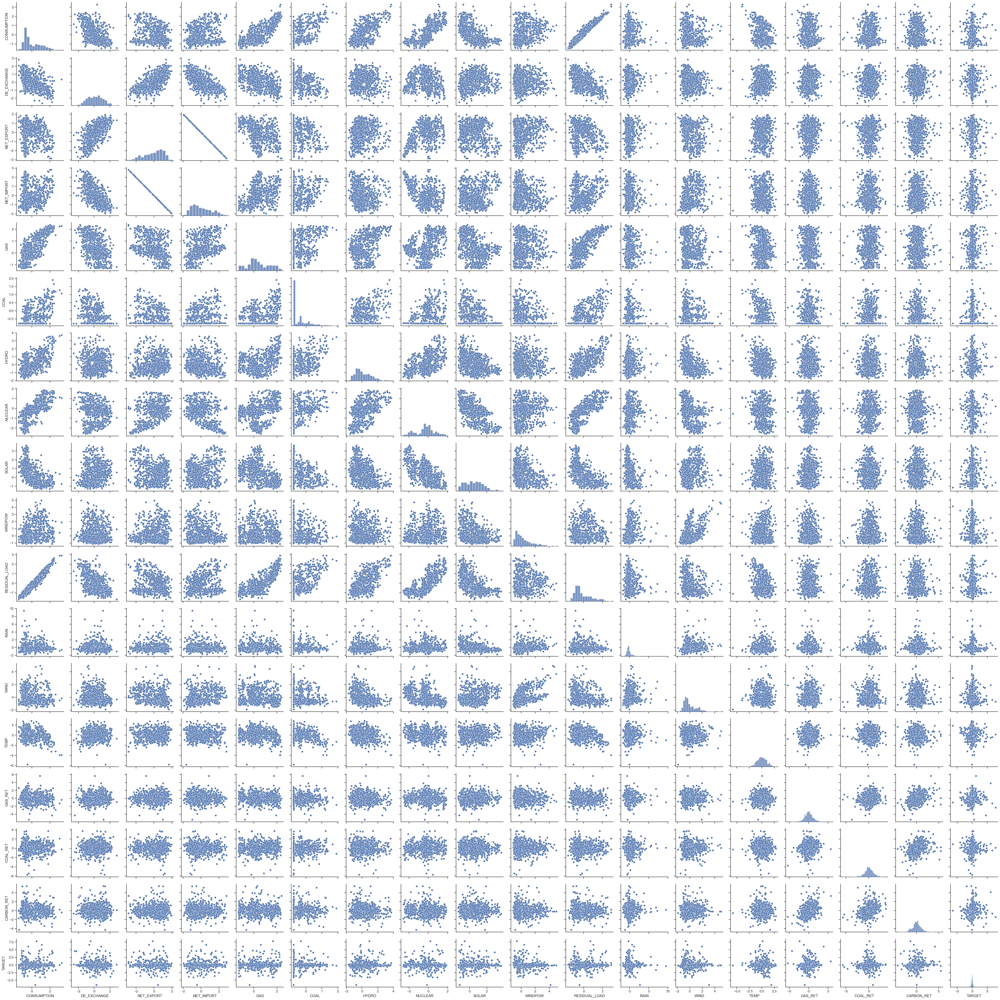

In [77]:
sns.set(style="ticks")
sns.pairplot(fr_train)
plt.tight_layout()

### Germany EDA

In [78]:
de_train.describe()


,CONSUMPTION,FR_EXCHANGE,NET_EXPORT,NET_IMPORT,GAS,COAL,HYDRO,NUCLEAR,SOLAR,WINDPOW,RESIDUAL_LOAD,RAIN,WIND,TEMP,GAS_RET,COAL_RET,CARBON_RET,TARGET
count,643.000000,643.000000,643.000000,643.000000,643.000000,643.000000,643.000000,643.000000,643.000000,643.000000,643.000000,596.000000,596.000000,596.000000,643.000000,643.000000,643.000000,643.000000
mean,0.379809,-0.172616,-0.327798,0.327798,0.814385,-0.255720,0.606018,-0.601507,0.301190,0.154515,0.011554,-0.038192,0.234705,0.005839,0.082186,0.051654,0.088062,0.148044
std,0.682092,0.988550,0.930585,0.930585,0.848854,0.773450,1.083933,0.882778,1.088365,1.070344,0.844800,1.004644,1.086147,0.944859,1.105919,1.022188,1.102142,1.047022
min,-2.265563,-2.856874,-2.464849,-2.279619,-1.004008,-1.491593,-1.373985,-2.689387,-1.442296,-1.235802,-2.613569,-2.128531,-1.880419,-4.549638,-5.349463,-5.392852,-4.281790,-3.075929
25%,-0.069473,-0.979886,-1.026464,-0.365121,0.166714,-0.907156,-0.227007,-1.339070,-0.689997,-0.688578,-0.482059,-0.644651,-0.586262,-0.616563,-0.604950,-0.455707,-0.506085,-0.324693
50%,0.288112,-0.172069,-0.404441,0.404441,0.809862,-0.325659,0.402352,-0.343602,0.296254,-0.078279,0.071007,-0.285575,-0.098259,-0.035360,0.034673,0.047114,0.054056,0.005057
75%,0.895751,0.640639,0.365121,1.026464,1.445299,0.283322,1.342489,0.070503,1.224825,0.643680,0.575759,0.324813,0.848908,0.589501,0.691052,0.634172,0.580153,0.386596
max,2.033851,2.634831,2.279619,2.464849,3.118082,1.902490,4.181936,0.842046,2.696571,3.509017,2.254155,7.756118,5.085624,2.858758,5.674778,3.607281,5.471818,7.138604


In [80]:
de_train.corr(method='spearman')

,CONSUMPTION,FR_EXCHANGE,NET_EXPORT,NET_IMPORT,GAS,COAL,HYDRO,NUCLEAR,SOLAR,WINDPOW,RESIDUAL_LOAD,RAIN,WIND,TEMP,GAS_RET,COAL_RET,CARBON_RET,TARGET
CONSUMPTION,1.000000,0.415534,0.547595,-0.547595,0.159437,0.458038,-0.402915,0.265307,-0.639085,0.473484,0.198318,0.202313,0.213251,0.143444,0.001484,0.057995,0.009161,-0.071736
FR_EXCHANGE,0.415534,1.000000,0.710612,-0.710612,-0.019835,0.441663,-0.341498,-0.129250,-0.255839,0.389755,-0.130431,-0.041072,0.444608,0.075096,-0.012284,-0.028639,0.003797,-0.094402
NET_EXPORT,0.547595,0.710612,1.000000,-1.000000,-0.224885,0.154033,-0.477122,0.128797,-0.448667,0.763360,-0.383785,0.117360,0.313388,0.099860,-0.045909,-0.016222,-0.072417,-0.306204
NET_IMPORT,-0.547595,-0.710612,-1.000000,1.000000,0.224885,-0.154033,0.477122,-0.128797,0.448667,-0.763360,0.383785,-0.117360,-0.313388,-0.099860,0.045909,0.016222,0.072417,0.306204
GAS,0.159437,-0.019835,-0.224885,0.224885,1.000000,0.354266,0.092914,0.240409,-0.225092,-0.445835,0.736765,-0.099670,-0.490361,0.005828,0.063643,0.028636,0.123330,0.253410
COAL,0.458038,0.441663,0.154033,-0.154033,0.354266,1.000000,-0.112219,0.048874,-0.319278,-0.229890,0.635426,-0.045041,0.136133,0.051806,0.051565,0.008699,0.074120,0.142054
HYDRO,-0.402915,-0.341498,-0.477122,0.477122,0.092914,-0.112219,1.000000,-0.059932,0.408875,-0.470051,0.169675,-0.125485,-0.272741,-0.109386,0.032448,-0.016576,0.072823,0.217900
NUCLEAR,0.265307,-0.129250,0.128797,-0.128797,0.240409,0.048874,-0.059932,1.000000,-0.392126,-0.022854,0.347602,0.072217,-0.444735,-0.124889,-0.010550,-0.000895,0.030507,0.012366
SOLAR,-0.639085,-0.255839,-0.448667,0.448667,-0.225092,-0.319278,0.408875,-0.392126,1.000000,-0.449626,-0.233092,-0.418986,0.059495,-0.071889,0.087948,-0.029308,0.004667,0.021202
WINDPOW,0.473484,0.389755,0.763360,-0.763360,-0.445835,-0.229890,-0.470051,-0.022854,-0.449626,1.000000,-0.644920,0.282294,0.392444,0.131571,-0.097049,-0.009083,-0.119232,-0.300933


c:\Users\fabro\miniconda3\envs\imperial\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\fabro\AppData\Local\Temp\ipykernel_43684\2383437830.py:3: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


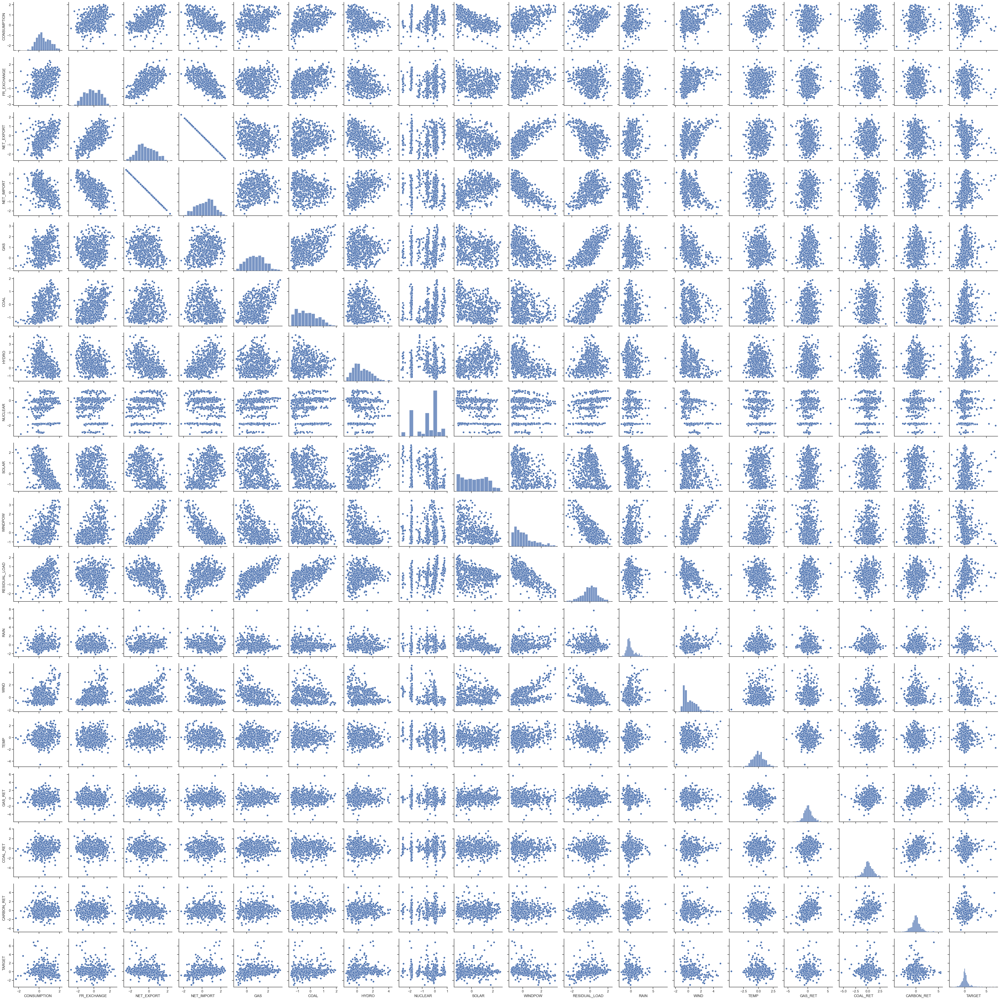

In [82]:
sns.set(style="ticks")
sns.pairplot(de_train)
plt.tight_layout()

### France vs Germany: Density Distribution Comparison

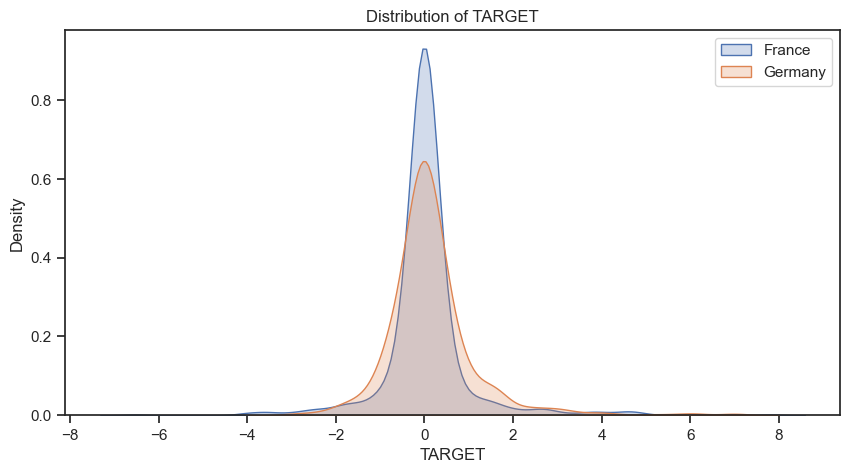

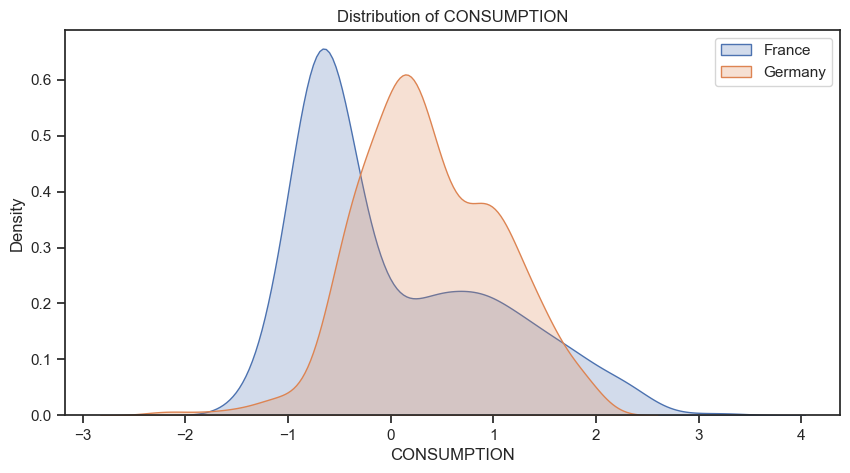

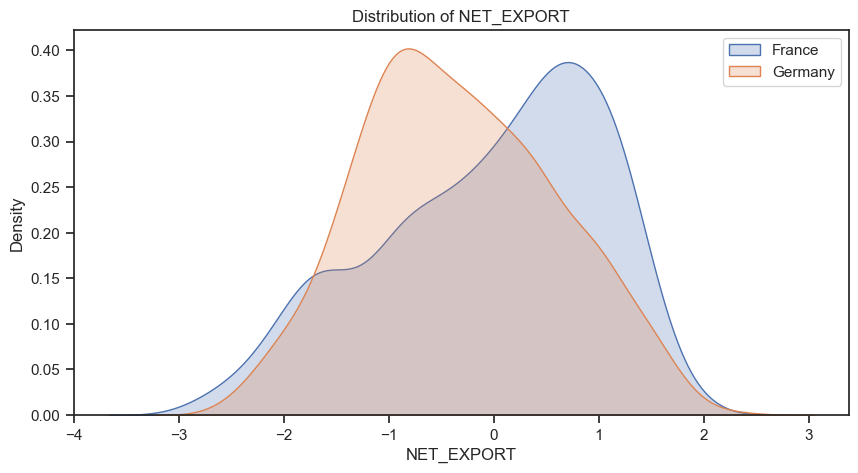

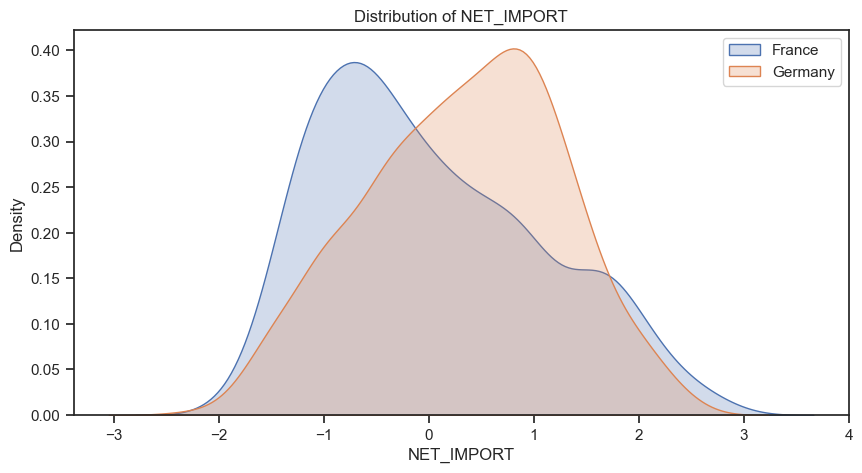

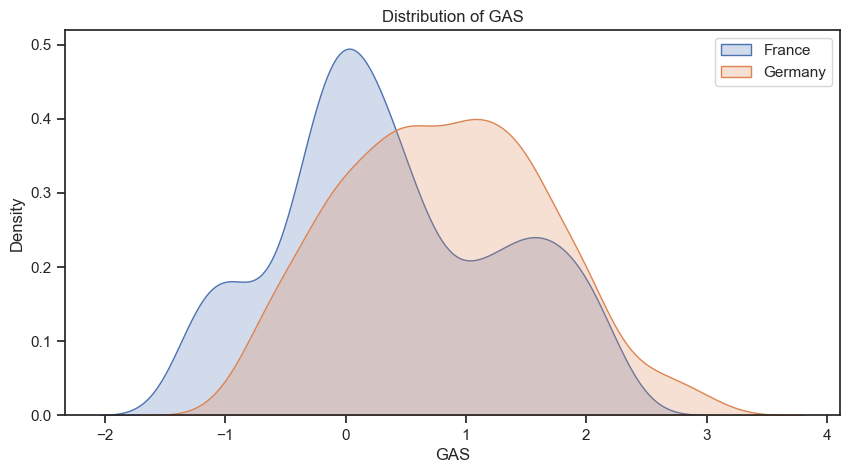

...

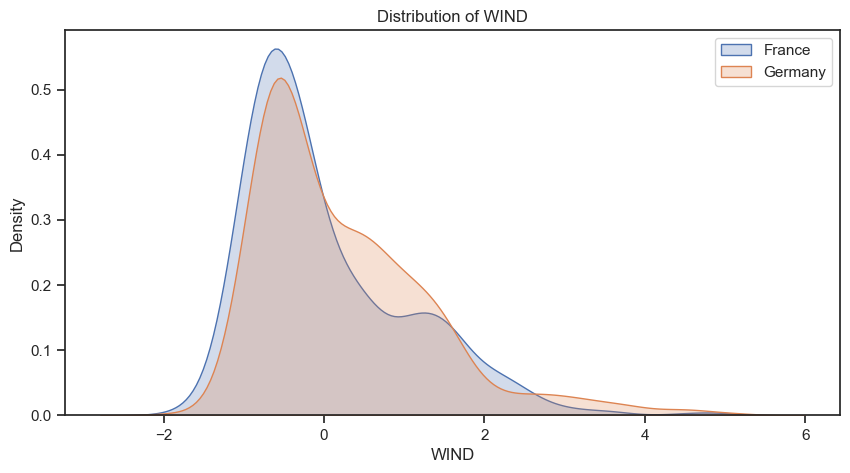

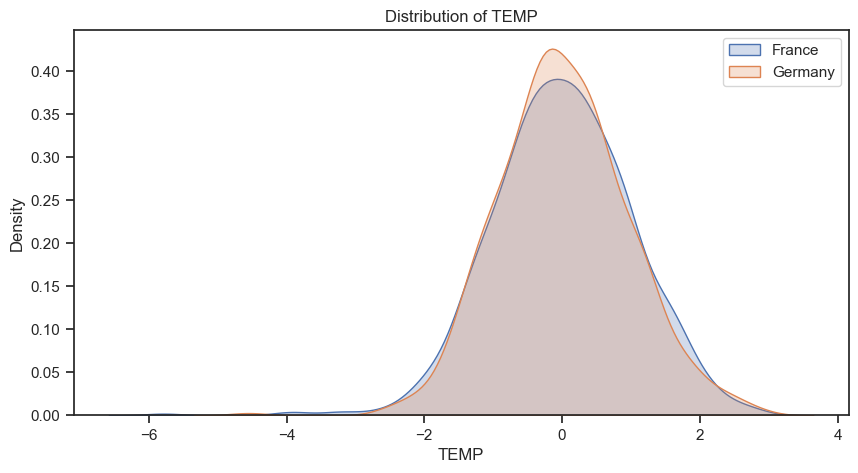

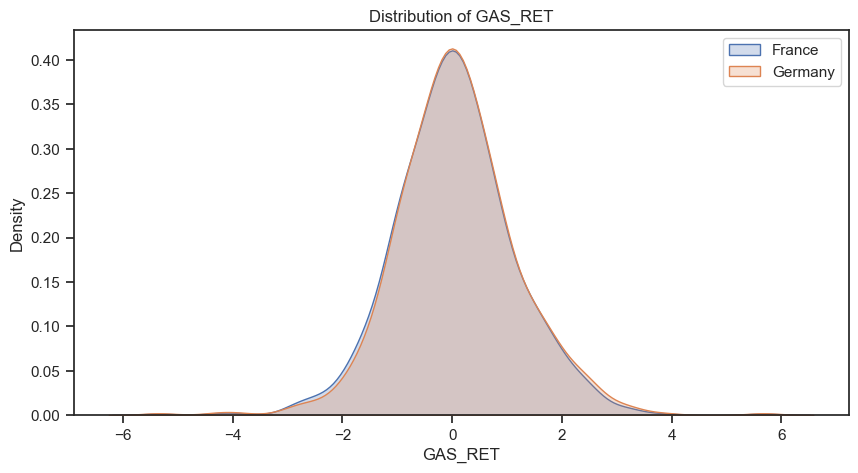

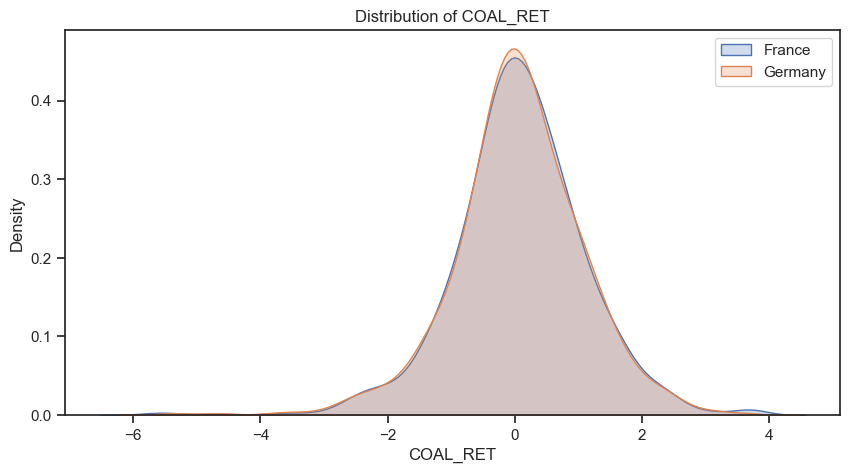

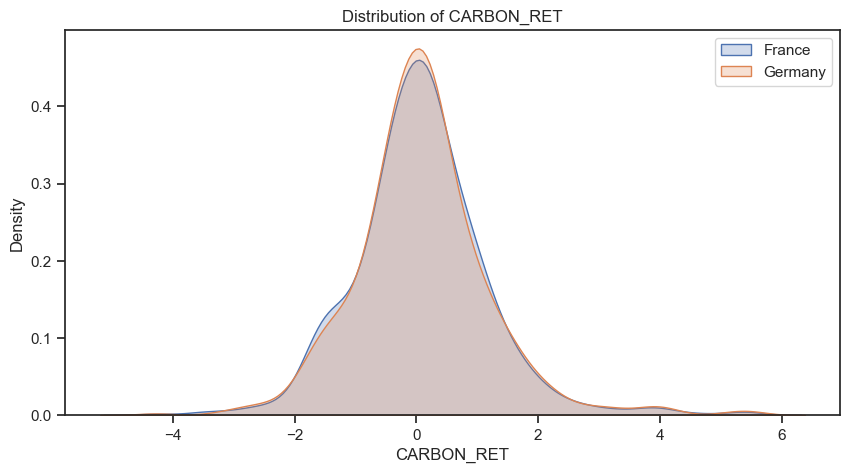

In [83]:
cols = ['TARGET','CONSUMPTION', 'NET_EXPORT', 'NET_IMPORT', 'GAS', 'COAL',
    'HYDRO', 'NUCLEAR', 'SOLAR', 'WINDPOW', 'RESIDUAL_LOAD', 'RAIN', 'WIND',
    'TEMP', 'GAS_RET', 'COAL_RET', 'CARBON_RET']

for col in cols:  # Assuming 'cols' list has the common columns of both dataframes
    plt.figure(figsize=(10, 5))
    sns.kdeplot(fr_train[col], label="France", fill=True)
    sns.kdeplot(de_train[col], label="Germany", fill=True)
    plt.title(f'Distribution of {col}')
    plt.legend()
    plt.show()


## Takeaways

- Both targets are leptokurtic
- France target is incorrelated with anything
- Germany target has a small but significant relationship with around 4 variables
- There are linearly dependent variables among predictors
- France predictor are mostly skewed, leptokurtic or in general not normally distributed
- Germany may be modeled as a linear model, France breaks almost all ols assumptions
- Tree based models might work, ANN may overfit